## [pyKNEEr](https://github.com/sbonaretti/pyKNEEr)

# [Preprocessing MR Knee Images](https://sbonaretti.github.io/pyKNEEr/preprocessing.html)

Preprocessing of MR images is fundamental to standardize spatial information and intensity of images

In the pipeline below:
- Steps 1-3 uniform image orientation, knee laterality, and image origin. The resulting image has the same intensity as the acquired `.dcm` image, but different collocation in space. It is saved as `_orig.mha`
- Steps 4-6 act on the intensities of the image, by correcting the inhomogeneous magnetic field, rescaling to a fixed range, and enhancing the cartilage contours [1]. The resulting image has different intensity than the acquired `.dcm` image, and it is used for atlas-based segmentation. It is saved as `_prep.mha`. These steps are computationally expensive, so if not needed, avoid them by setting `intensity_standardization` to zero (see below) 

## Import packages

In [1]:
%load_ext autoreload 
%autoreload 2

In [2]:
from pykneer import pykneer_io           as io
from pykneer import preprocessing_for_nb as prep

## Image information

Inputs:   
- `input_file_name` contains the list of the images to be preprocessed 
- `nOfCores` is the number of cores used for computations (computations are parallelized for speed)
- `intensity_standardization` is a flag that determines if the intensity standardization is performed (0=no, 1=yes)

In [3]:
input_file_name           = "./image_list_preprocessing_OAI2_BL.txt"
n_of_cores                = 10
intensity_standardization = 1

#### Read image data
- `imageData` is a dictionary (or struct), where each cell corresponds to an image. For each image, information such as paths and file names are stored  

In [4]:
image_data = io.load_image_data_preprocessing(input_file_name)

001_BL
002_BL
003_BL
004_BL
005_BL
006_BL
007_BL
008_BL
009_BL
010_BL
011_BL
012_BL
013_BL
014_BL
015_BL
016_BL
017_BL
018_BL
019_BL
020_BL
021_BL
022_BL
023_BL
024_BL
025_BL
026_BL
027_BL
028_BL
029_BL
030_BL
031_BL
032_BL
033_BL
034_BL
035_BL
036_BL
037_BL
038_BL
039_BL
040_BL
041_BL
042_BL
043_BL
044_BL
045_BL
046_BL
047_BL
048_BL
049_BL
050_BL
051_BL
052_BL
053_BL
054_BL
055_BL
056_BL
057_BL
058_BL
059_BL
060_BL
061_BL
062_BL
063_BL
064_BL
065_BL
066_BL
067_BL
068_BL
069_BL
070_BL
071_BL
072_BL
073_BL
074_BL
075_BL
076_BL
077_BL
078_BL
079_BL
080_BL
081_BL
082_BL
083_BL
084_BL
085_BL
086_BL
087_BL
088_BL
-> information loaded for 88 subjects


## Spatial standardization

#### Step 0: Read the dicom images

In [5]:
prep.read_dicom_stack(image_data, n_of_cores)

-> 007_BL
Size:      384   384   160
Spacing:   0.36 0.36 0.70
Origin:    133.57 -94.21 77.75
Direction: 
0.00 0.00 -1.00 
1.00 0.00 0.00 
0.00 -1.00 0.00
-> 028_BL
Size:      384   384   160
Spacing:   0.36 0.36 0.70
Origin:    -8.63 -78.93 84.53
Direction: 
-0.09 0.00 -1.00 
1.00 0.00 -0.09 
0.00 -1.00 -0.00
-> 013_BL
Size:      384   384   160
Spacing:   0.36 0.36 0.70
Origin:    2.80 -84.00 87.92
Direction: 
-0.12 0.00 -0.99 
0.99 0.00 -0.12 
0.00 -1.00 -0.00-> 025_BL

Size:      384   384   160
Spacing:   0.36 0.36 0.70
Origin:    120.98 -88.89 79.69
Direction: 
0.00 0.00 -1.00 
1.00 0.00 0.00 
0.00 -1.00 0.00
-> 004_BL
Size:      384   384   160
Spacing:   0.36 0.36 0.70
Origin:    142.67 -61.10 56.92
Direction: 
-0.07 0.00 -1.00 
1.00 0.00 -0.07 
0.00 -1.00 -0.00
-> 019_BL
Size:      384   384   160
Spacing:   0.36 0.36 0.70
Origin:    132.11 -77.55 77.75
Direction: 
-0.14 0.00 -0.99 
0.99 0.00 -0.14 
0.00 -1.00 -0.00
-> 010_BL
Size:      384   384   160
Spacing:   0.36 0.36 0.7

#####   Save image header
The image header of the first slice of the dicom stack is saved in a `.txt` file. This can be useful to extract information such as subject's date of birth, exam date, etc.

In [6]:
prep.print_dicom_header(image_data, n_of_cores)

-> Dicom headers written
-> The total time was 2.94 seconds (about 0 min)


#### Step 1: Change orientation to RAI 
All images are oriented to the RAI (right, anterior, inferior) orientation

In [7]:
prep.orientation_to_rai(image_data, n_of_cores)

-> Image orientation changed
-> The total time was 21.53 seconds (about 0 min)


#### Step 2: Change laterality if knee is right
Right knees are flipped to left knees to have the same laterality 

In [8]:
prep.flip_rl(image_data, n_of_cores)

-> Image laterality changed for right images
-> The total time was 4.14 seconds (about 0 min)


#### 3. Set image origin to (0,0,0)
All images are set to the origin (0,0,0). Images are saved as *_orig.mha and they are anonymized

In [9]:
prep.origin_to_zero(image_data, n_of_cores)

-> Image origin changed
-> _orig.mha images saved
-> The total time was 5.37 seconds (about 0 min)


#### 4. Correct magnetic field inhomogeneities
Magnetic fields inhomogeneities create grey shades on images. This correction removes these shades. This is the longest step of the processing. It can take up to 15-20 min on a standard PC or laptop

In [10]:
if intensity_standardization == 1:
    prep.field_correction(image_data, n_of_cores) # add "#" in front of the command if intensity standardization is not needed

-> The total time for image 028_BL was 749 seconds (about 12 min)
-> The total time for image 019_BL was 911 seconds (about 15 min)
-> The total time for image 022_BL was 1021 seconds (about 17 min)
-> The total time for image 013_BL was 1090 seconds (about 18 min)
-> The total time for image 007_BL was 1119 seconds (about 18 min)
-> The total time for image 016_BL was 1174 seconds (about 19 min)
-> The total time for image 004_BL was 1264 seconds (about 21 min)
-> The total time for image 001_BL was 1305 seconds (about 21 min)
-> The total time for image 025_BL was 1362 seconds (about 22 min)
-> The total time for image 010_BL was 1387 seconds (about 23 min)
-> The total time for image 023_BL was 830 seconds (about 13 min)
-> The total time for image 029_BL was 1199 seconds (about 19 min)
-> The total time for image 014_BL was 953 seconds (about 15 min)
-> The total time for image 008_BL was 966 seconds (about 16 min)
-> The total time for image 002_BL was 906 seconds (about 15 min)
-

#### 5. Rescale intensities to [0 100]
Intensies are rescaled to the fixed range [0,100] to obtain homogeneous intensity range across images

In [11]:
if intensity_standardization == 1:
    prep.rescale_to_range(image_data, n_of_cores) # add "#" in front of the command if intensity standardization is not needed

-> Image intensities rescaled
-> The total time was 16.16 seconds (about 0 min)


#### 6. Edge preserving smoothing
Cartilage contours are enhanced using a curvature anisotropic diffusion filter

In [12]:
if intensity_standardization == 1:
    prep.edge_preserving_smoothing(image_data, n_of_cores) # add "#" in front of the command if intensity standardization is not needed

-> Image smoothed
-> _prep.mha images saved
-> The total time was 576.65 seconds (about 9 min)


## Visualize original and preprocessed image
Each row corresponds to one image. Left: Original image after spatial preprocessing (steps 1-3). Right: Preprocessed image after intensities correction (steps 4-6). 
Note: A total black rendering of an original image is caused by very large intensity distribution

<Figure size 576x25344 with 0 Axes>

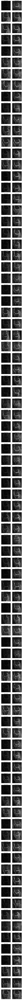

In [13]:
prep.show_preprocessed_images(image_data, intensity_standardization)

### References

[1] Shan L., Zach C., Charles C., Niethammer M. [*Automatic Atlas-Based Three-Label Cartilage Segmentation from MR Knee Images.*](https://www.ncbi.nlm.nih.gov/pubmed/25128683) Med Image Anal. Oct;18(7):1233-46. 2014.

### Dependencies

In [14]:
%load_ext watermark
%watermark -v -m -p SimpleITK,ikt,numpy,matplotlib,multiprocessing

CPython 3.6.1
IPython 6.4.0

SimpleITK unknown
ikt not installed
numpy 1.14.5
matplotlib 2.2.2
multiprocessing unknown

compiler   : GCC 4.8.5 20150623 (Red Hat 4.8.5-11)
system     : Linux
release    : 3.10.0-862.14.4.el7.x86_64
machine    : x86_64
processor  : x86_64
CPU cores  : 20
interpreter: 64bit
